# **Lab5.1 : CNN Feature maps**

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from torch import nn
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms


## Get VGG16 Pretrained model
Explore the VGG16 achitecture.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (18): ReLU(inplace=True)
    (19): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (20): ReLU(inplace=True)
    (21): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (22): ReLU(inplace=True)
    (23): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (24): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (25): ReLU(inplace=True)
    (26): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (27): ReLU(inplace=True)
    (28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (29): ReLU(inplace=True)
    (30): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(7, 7))
  (classifier): Sequential(
    (0): Linear(in_features=25088, out_features=4096, bias=True)
    (1): ReLU(inplace=True)
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=4096, out_features=4096, bias=True)
    (4): ReLU(inplace=True)
    (5): Dropout(p=0.5, inplace=False)
    (6): Linear(in_features=4096, out_features=1000, bias=True)
  )
)
```

</details>


In [3]:
### START CODE HERE ###
vgg16 = models.vgg16(pretrained=True)
print(vgg16)

### END CODE HERE ###

c:\Python-Envs\cuda_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Python-Envs\cuda_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\Kolawat/.cache\torch\hub\checkpoints\vgg16-397923af.pth


100%|██████████| 528M/528M [00:12<00:00, 45.4MB/s] 


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Explore all layers in feature extractor part.
[Read more.](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.named_modules:~:text=named_modules(memo%3DNone%2C%20prefix%3D%27%27%2C%20remove_duplicate%3DTrue))


<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
-------------------
0:Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
1:ReLU(inplace=True)
-------------------
2:Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
3:ReLU(inplace=True)
-------------------
4:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
...
28:Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
29:ReLU(inplace=True)
-------------------
30:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
```

</details>


In [4]:
### START CODE HERE ###
# Explore all layers in the features (feature extractor) part
for idx, layer in enumerate(vgg16.features):
    print(f"-------------------")
    print(f"{idx}:{layer}")

### END CODE HERE ###

-------------------
0:Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
1:ReLU(inplace=True)
-------------------
2:Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
3:ReLU(inplace=True)
-------------------
4:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
-------------------
5:Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
6:ReLU(inplace=True)
-------------------
7:Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
8:ReLU(inplace=True)
-------------------
9:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
-------------------
10:Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
11:ReLU(inplace=True)
-------------------
12:Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
13:ReLU(inplace=True)
-------------------
14

Examine weight and bias of first Convolution layer and ReLU layer. [Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
torch.Size([64, 3, 3, 3])
Kernel : 0
*************************************
Channel : 0
[[-0.5537306   0.1427047   0.5289615 ]
 [-0.58312404  0.35655147  0.76566225]
 [-0.69022113 -0.04801885  0.48409155]]
Min coefficients -0.69022113
-------------------------------------
Channel : 1
[[ 0.17548391  0.00986297 -0.08141315]
 [ 0.04408892 -0.07032251 -0.26035076]
 [ 0.13239175 -0.1727862  -0.1322633 ]]
Min coefficients -0.26035076
-------------------------------------
Channel : 2
[[ 0.31302562 -0.1659134  -0.42752257]
 [ 0.47518674 -0.08267727 -0.48699915]
 [ 0.63202524  0.01930757 -0.2775303 ]]
Min coefficients -0.48699915
-------------------------------------


Kernel : 1
*************************************
Channel : 0
[[ 0.23253721  0.12665984  0.1860546 ]
 [-0.42805314 -0.24348575  0.24628444]
 [-0.2506616   0.14177004 -0.0054864 ]]
Min coefficients -0.42805314
-------------------------------------
Channel : 1
[[-0.14076217 -0.21902554  0.15040672]
 [-0.84126675 -0.3517562   0.5639763 ]
 [-0.24194452  0.5192758   0.5391499 ]]
Min coefficients -0.84126675
-------------------------------------
Channel : 2
[[-0.31432396 -0.37047786 -0.13093661]
 [-0.47144184 -0.15503426  0.3458899 ]
 [ 0.05438393  0.5868277   0.49579924]]
Min coefficients -0.47144184
-------------------------------------

...
```

</details>

In [5]:
### START CODE HERE ###
# Get the first convolution layer and first ReLU layer
first_conv = vgg16.features[0]  # Layer 0: Conv2d
first_relu = vgg16.features[1]  # Layer 1: ReLU

# Print weight shape
print(first_conv.weight.shape)

# Examine weights for first few kernels
weights = first_conv.weight.data.numpy()

# Display first few kernels (limit to avoid too much output)
num_kernels_to_show = 3  # Show first 3 kernels
for kernel_idx in range(num_kernels_to_show):
    print(f"\nKernel : {kernel_idx}")
    print("*************************************")
    
    # Each kernel has 3 channels (RGB)
    for channel_idx in range(3):
        print(f"Channel : {channel_idx}")
        kernel_channel = weights[kernel_idx, channel_idx, :, :]
        print(kernel_channel)
        print(f"Min coefficients {kernel_channel.min()}")
        print("-------------------------------------")

### END CODE HERE ###

torch.Size([64, 3, 3, 3])

Kernel : 0
*************************************
Channel : 0
[[-0.5537306   0.1427047   0.5289615 ]
 [-0.58312404  0.35655147  0.76566225]
 [-0.69022113 -0.04801885  0.48409155]]
Min coefficients -0.6902211308479309
-------------------------------------
Channel : 1
[[ 0.17548391  0.00986297 -0.08141315]
 [ 0.04408892 -0.07032251 -0.26035076]
 [ 0.13239175 -0.1727862  -0.1322633 ]]
Min coefficients -0.26035076379776
-------------------------------------
Channel : 2
[[ 0.31302562 -0.1659134  -0.42752257]
 [ 0.47518674 -0.08267727 -0.48699915]
 [ 0.63202524  0.01930757 -0.2775303 ]]
Min coefficients -0.48699915409088135
-------------------------------------

Kernel : 1
*************************************
Channel : 0
[[ 0.23253721  0.12665984  0.1860546 ]
 [-0.42805314 -0.24348575  0.24628444]
 [-0.2506616   0.14177004 -0.0054864 ]]
Min coefficients -0.4280531406402588
-------------------------------------
Channel : 1
[[-0.14076217 -0.21902554  0.15040672]
 [-0

In [6]:
assert isinstance(first_conv, nn.Conv2d), "First layer should be a convolutional layer"
assert isinstance(first_relu, nn.ReLU), "Second layer should be a ReLU activation"
assert first_conv.weight.shape == (64, 3, 3, 3), "First layer weight shape should be (64, 3, 3, 3)"

Examine Biases
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
Bias : Parameter containing:
tensor([ 0.4034,  0.3778,  0.4644, -0.3228,  0.3940, -0.3953,  0.3951, -0.5496,
         ...
         0.2300,  0.4979,  0.5553,  0.5230, -0.2182,  0.0117, -0.5516,  0.2108],
       requires_grad=True)
```

</details>

In [7]:
### START CODE HERE ###
print("Bias :", first_conv.bias)
### END CODE HERE ###

Bias : Parameter containing:
tensor([ 0.4034,  0.3778,  0.4644, -0.3228,  0.3940, -0.3953,  0.3951, -0.5496,
         0.2693, -0.7602, -0.3508,  0.2334, -1.3239, -0.1694,  0.3938, -0.1026,
         0.0460, -0.6995,  0.1549,  0.5628,  0.3011,  0.3425,  0.1073,  0.4651,
         0.1295,  0.0788, -0.0492, -0.5638,  0.1465, -0.3890, -0.0715,  0.0649,
         0.2768,  0.3279,  0.5682, -1.2640, -0.8368, -0.9485,  0.1358,  0.2727,
         0.1841, -0.5325,  0.3507, -0.0827, -1.0248, -0.6912, -0.7711,  0.2612,
         0.4033, -0.4802, -0.3066,  0.5807, -1.3325,  0.4844, -0.8160,  0.2386,
         0.2300,  0.4979,  0.5553,  0.5230, -0.2182,  0.0117, -0.5516,  0.2108],
       requires_grad=True)


## Process the feature maps
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab5_CNN/assets/1.png?raw=true)

</details>

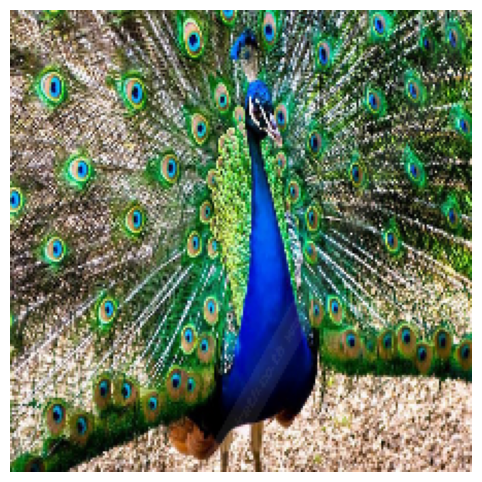

In [12]:
### START CODE HERE ###
# If you know the specific path after extraction
img_path = './data/lab5-img.jpg'  # Adjust based on actual structure
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (224, 224))

# Display the image
plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.axis('off')
plt.show()

# Normalize for VGG16 processing
img = img.astype(np.float32) / 255.0
### END CODE HERE ###

Normalize the image using the mean and standard deviation values from the [VGG16 normalization parameters.](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html)
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab5_CNN/assets/2.png?raw=true)

</details>

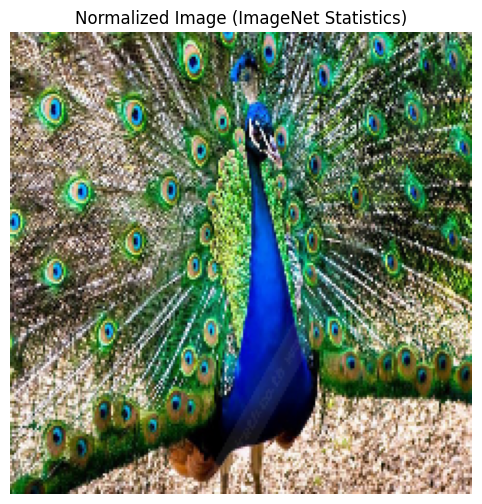

Original image range: [0.000, 1.000]
Normalized image range: [-2.118, 2.640]
Normalization mean: [0.485 0.456 0.406]
Normalization std: [0.229 0.224 0.225]


In [13]:
### START CODE HERE ###
# VGG16 normalization parameters (ImageNet dataset statistics)
mean = np.array([0.485, 0.456, 0.406])  # RGB mean values
std = np.array([0.229, 0.224, 0.225])   # RGB standard deviation values

# Apply normalization: (image - mean) / std
img_normalized = (img - mean) / std

# Display the normalized image
plt.figure(figsize=(8, 6))
# For visualization, we need to denormalize and clip values for proper display
img_display = img_normalized * std + mean  # Denormalize for display
img_display = np.clip(img_display, 0, 1)   # Clip to valid range [0, 1]

plt.imshow(img_display)
plt.title('Normalized Image (ImageNet Statistics)')
plt.axis('off')
plt.show()

print(f"Original image range: [{img.min():.3f}, {img.max():.3f}]")
print(f"Normalized image range: [{img_normalized.min():.3f}, {img_normalized.max():.3f}]")
print(f"Normalization mean: {mean}")
print(f"Normalization std: {std}")
### END CODE HERE ###

Convert the [NumPy image to a PyTorch tensor](https://pytorch.org/docs/stable/torch.html#:~:text=memory%2Dmapped%20file.-,from_numpy,-Creates%20a%20Tensor), ensuring it has the [correct dimensions and data type](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html) for input to the first convolution layer.

In [14]:
### START CODE HERE ###
# Convert normalized numpy array to PyTorch tensor
# VGG16 expects input format: (batch_size, channels, height, width)
# Current img_normalized shape: (height, width, channels) - HWC format

# Step 1: Convert to tensor and change from HWC to CHW format
img_tensor = torch.from_numpy(img_normalized.transpose(2, 0, 1)).float()

# Step 2: Add batch dimension - from (C, H, W) to (1, C, H, W)
img_tensor = img_tensor.unsqueeze(0)

print(f"Original numpy shape (HWC): {img_normalized.shape}")
print(f"Tensor shape (NCHW): {img_tensor.shape}")
print(f"Tensor dtype: {img_tensor.dtype}")
print(f"Tensor range: [{img_tensor.min():.3f}, {img_tensor.max():.3f}]")

# Verify tensor is ready for VGG16
expected_shape = (1, 3, 224, 224)  # (batch_size, channels, height, width)
assert img_tensor.shape == expected_shape, f"Expected {expected_shape}, got {img_tensor.shape}"
print("✓ Tensor is ready for VGG16 input!")
### END CODE HERE ###

Original numpy shape (HWC): (224, 224, 3)
Tensor shape (NCHW): torch.Size([1, 3, 224, 224])
Tensor dtype: torch.float32
Tensor range: [-2.118, 2.640]
✓ Tensor is ready for VGG16 input!


Complete the function below. <br>
The plot_featuremap function takes a set of feature maps and creates a grid of subplots, each displaying a single feature map. 

In [15]:
### START CODE HERE ###
def plot_featuremap(img, title):
    """
    Plot feature maps in a grid layout
    
    Args:
        img: Feature maps tensor of shape (batch_size, channels, height, width) or (channels, height, width)
        title: Title for the plot
    """
    # Handle different input shapes
    if len(img.shape) == 4:  # (batch_size, channels, height, width)
        feature_maps = img.squeeze(0)  # Remove batch dimension
    else:  # (channels, height, width)
        feature_maps = img
    
    # Convert to numpy if it's a tensor
    if torch.is_tensor(feature_maps):
        feature_maps = feature_maps.detach().numpy()
    
    num_features = feature_maps.shape[0]
    
    # Calculate grid size (try to make it roughly square)
    grid_size = int(np.ceil(np.sqrt(num_features)))
    rows = grid_size
    cols = grid_size
    
    # Adjust if we have too many empty subplots
    while rows * cols - num_features >= cols:
        rows -= 1
    
    # Create the plot
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    fig.suptitle(title, fontsize=16)
    
    # Handle case where we only have one row or column
    if rows == 1 and cols == 1:
        axes = [axes]
    elif rows == 1 or cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()
    
    # Plot each feature map
    for i in range(num_features):
        ax = axes[i]
        # Use grayscale colormap for better visualization
        im = ax.imshow(feature_maps[i], cmap='gray', aspect='auto')
        ax.set_title(f'Feature {i}', fontsize=8)
        ax.axis('off')
        
        # Add colorbar for reference
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # Hide empty subplots
    for i in range(num_features, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
### END CODE HERE ###

Pass the image to the first convolutional layer and display the feature map output using your `plot_featuremap()` function.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab5_CNN/assets/3.png?raw=true)
</details>

Input tensor shape: torch.Size([1, 3, 224, 224])
Convolution output shape: torch.Size([1, 64, 224, 224])
Number of feature maps: 64
Feature map size: 224x224
Feature map value range: [-18.154, 17.627]


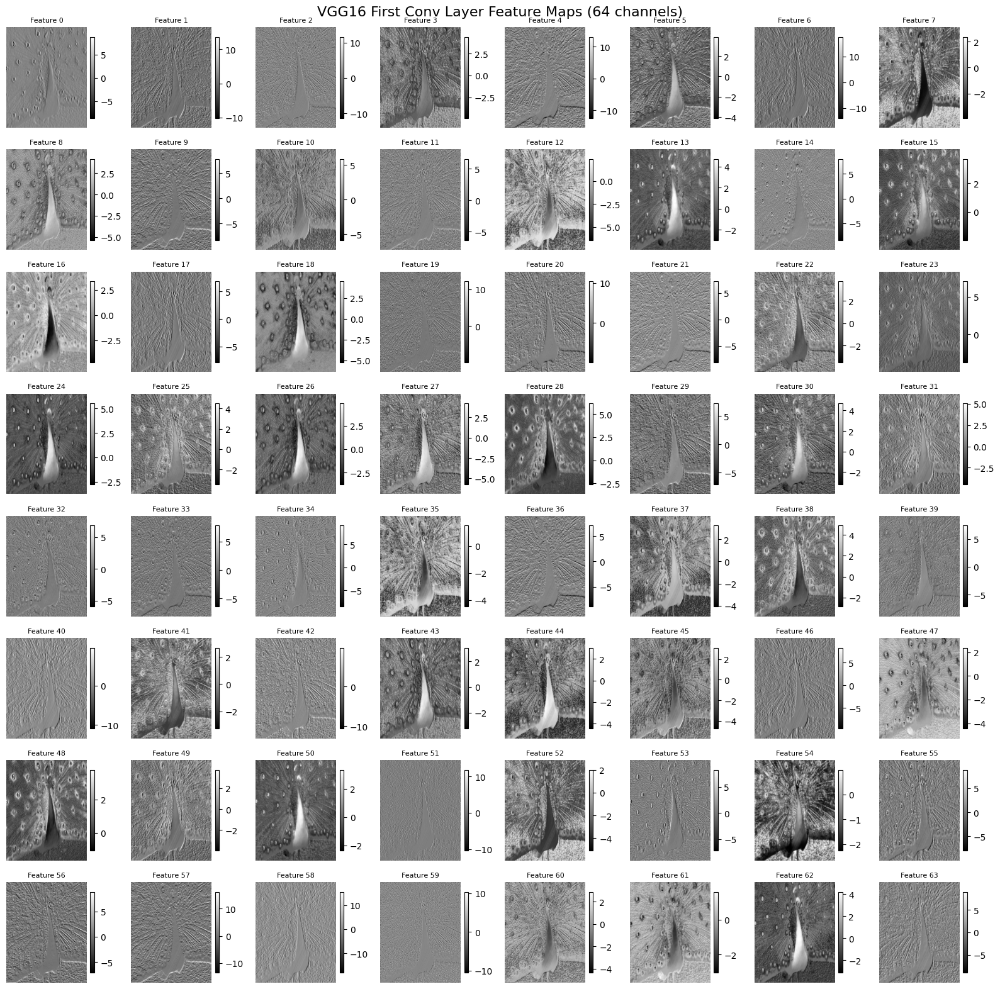

In [16]:
### START CODE HERE ###
# Set model to evaluation mode
vgg16.eval()

# Pass image through first convolutional layer
with torch.no_grad():
    conv_features = first_conv(img_tensor)

# Print information about the feature maps
print(f"Input tensor shape: {img_tensor.shape}")
print(f"Convolution output shape: {conv_features.shape}")
print(f"Number of feature maps: {conv_features.shape[1]}")
print(f"Feature map size: {conv_features.shape[2]}x{conv_features.shape[3]}")
print(f"Feature map value range: [{conv_features.min():.3f}, {conv_features.max():.3f}]")

# Visualize the feature maps
plot_featuremap(conv_features, "VGG16 First Conv Layer Feature Maps (64 channels)")
### END CODE HERE ###

Pass the image to the first ReLU layer and display the feature map output using your `plot_featuremap()` function.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab5_CNN/assets/4.png?raw=true)

</details>

Before ReLU - Min: -18.154, Max: 17.627
After ReLU - Min: 0.000, Max: 17.627
Number of negative values clipped: 1658723


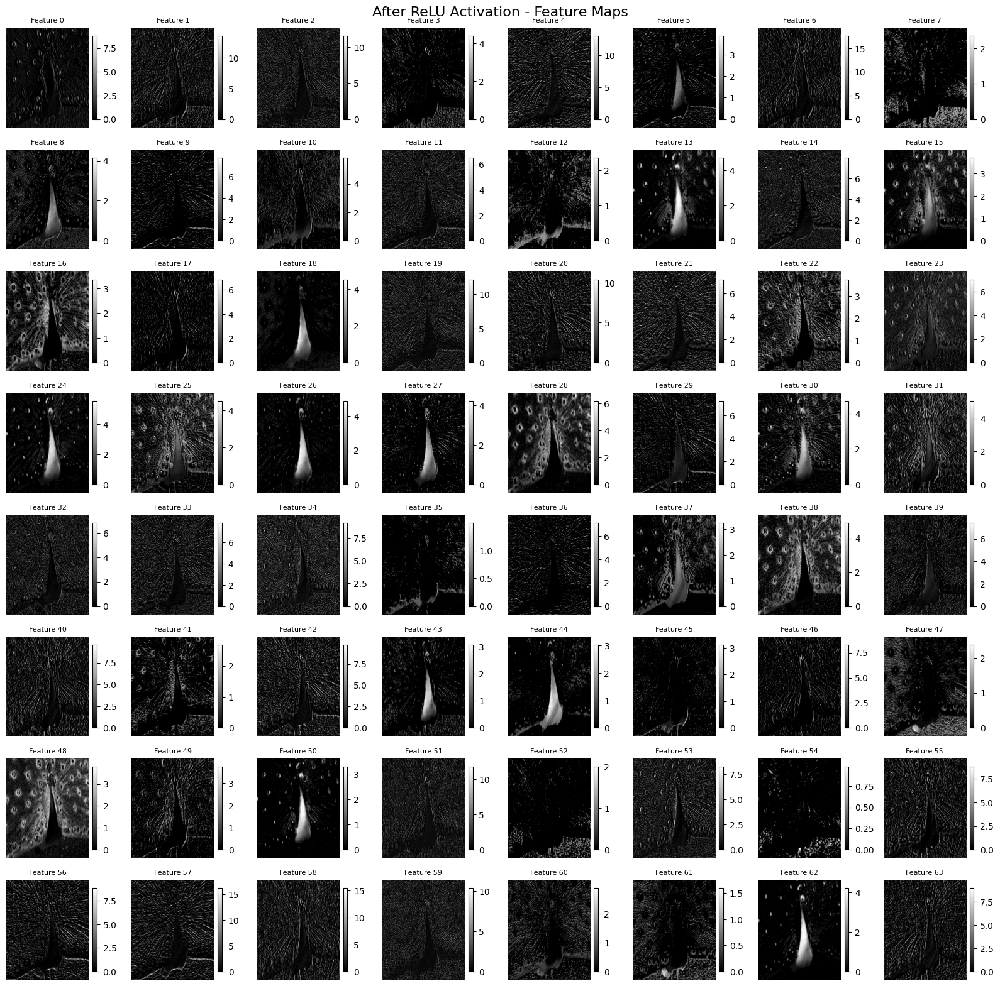

In [17]:
### START CODE HERE ###
# Apply ReLU activation to the convolution features
with torch.no_grad():
    relu_output = torch.relu(conv_features)

# Compare before and after ReLU
print(f"Before ReLU - Min: {conv_features.min():.3f}, Max: {conv_features.max():.3f}")
print(f"After ReLU - Min: {relu_output.min():.3f}, Max: {relu_output.max():.3f}")
print(f"Number of negative values clipped: {(conv_features < 0).sum().item()}")

# Visualize the ReLU activated feature maps
plot_featuremap(relu_output, "After ReLU Activation - Feature Maps")
### END CODE HERE ###

## Convolution 2D from scratch
Complete the function below

In [18]:
### START CODE HERE ###
def convolution2d(img, kernel, padding, stride):
    """
    Optimized 2D convolution using vectorized operations
    """
    # Handle input format
    if len(img.shape) == 3 and img.shape[2] <= 4:
        img = img.transpose(2, 0, 1)
    
    in_channels, img_height, img_width = img.shape
    out_channels, _, kernel_height, kernel_width = kernel.shape
    
    # Calculate output dimensions
    out_height = (img_height + 2 * padding - kernel_height) // stride + 1
    out_width = (img_width + 2 * padding - kernel_width) // stride + 1
    
    # Apply padding
    if padding > 0:
        padded_img = np.pad(img, ((0, 0), (padding, padding), (padding, padding)), mode='constant')
    else:
        padded_img = img
    
    # Initialize output
    output = np.zeros((out_channels, out_height, out_width))
    
    # Vectorized convolution
    for out_ch in range(out_channels):
        for y in range(out_height):
            for x in range(out_width):
                y_pos = y * stride
                x_pos = x * stride
                
                # Extract patch and compute convolution
                patch = padded_img[:, y_pos:y_pos+kernel_height, x_pos:x_pos+kernel_width]
                output[out_ch, y, x] = np.sum(patch * kernel[out_ch])
    
    return output
### END CODE HERE ###

Copy the weights and biases from `vgg16` and then use each kernel perform a 2D convolution using `convolution2d` and display the resulting feature map
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab5_CNN/assets/5.png?raw=true)

</details>

Weights shape: (64, 3, 3, 3)
Biases shape: (64,)
Convolution result shape: (64, 224, 224)
Result value range: [-18.154, 17.627]


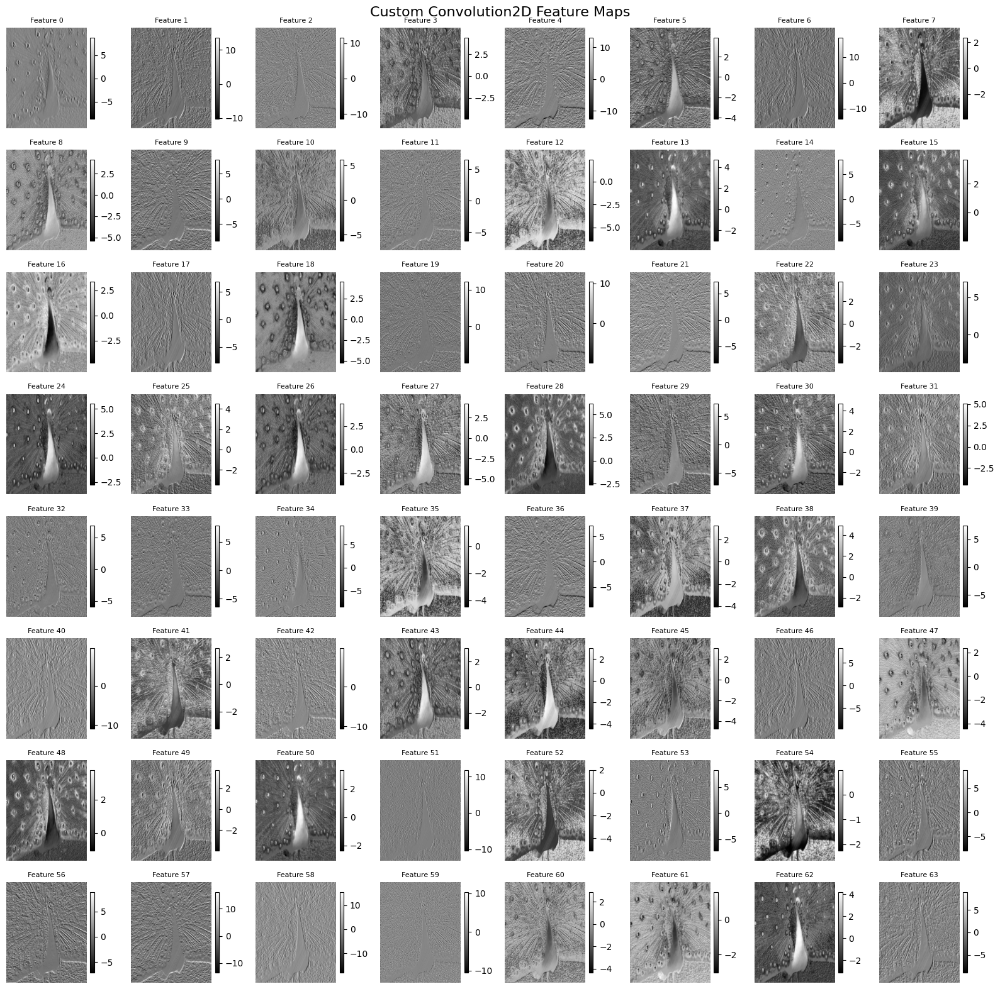

In [19]:
### START CODE HERE ###
# Copy weights and biases from VGG16
weights = first_conv.weight.data.numpy()  # (64, 3, 3, 3)
biases = first_conv.bias.data.numpy()     # (64,)

print(f"Weights shape: {weights.shape}")
print(f"Biases shape: {biases.shape}")

# Use the normalized image as input
img_input = img_normalized  # (224, 224, 3)

# Perform 2D convolution with our custom function
conv_result = convolution2d(img_input, weights, padding=1, stride=1)

# Add bias to each channel
for ch in range(conv_result.shape[0]):
    conv_result[ch] += biases[ch]

print(f"Convolution result shape: {conv_result.shape}")
print(f"Result value range: [{conv_result.min():.3f}, {conv_result.max():.3f}]")

# Display the feature maps
plot_featuremap(conv_result, "Custom Convolution2D Feature Maps")
### END CODE HERE ###

After performing the `convolution2d` operation, apply the ReLU activation function to the output. Then, display the resulting feature map.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab5_CNN/assets/6.png?raw=true)

</details>

Before ReLU - Min: -18.154, Max: 17.627
After ReLU - Min: 0.000, Max: 17.627
Number of negative values clipped: 1658723
Percentage of values clipped: 51.65%


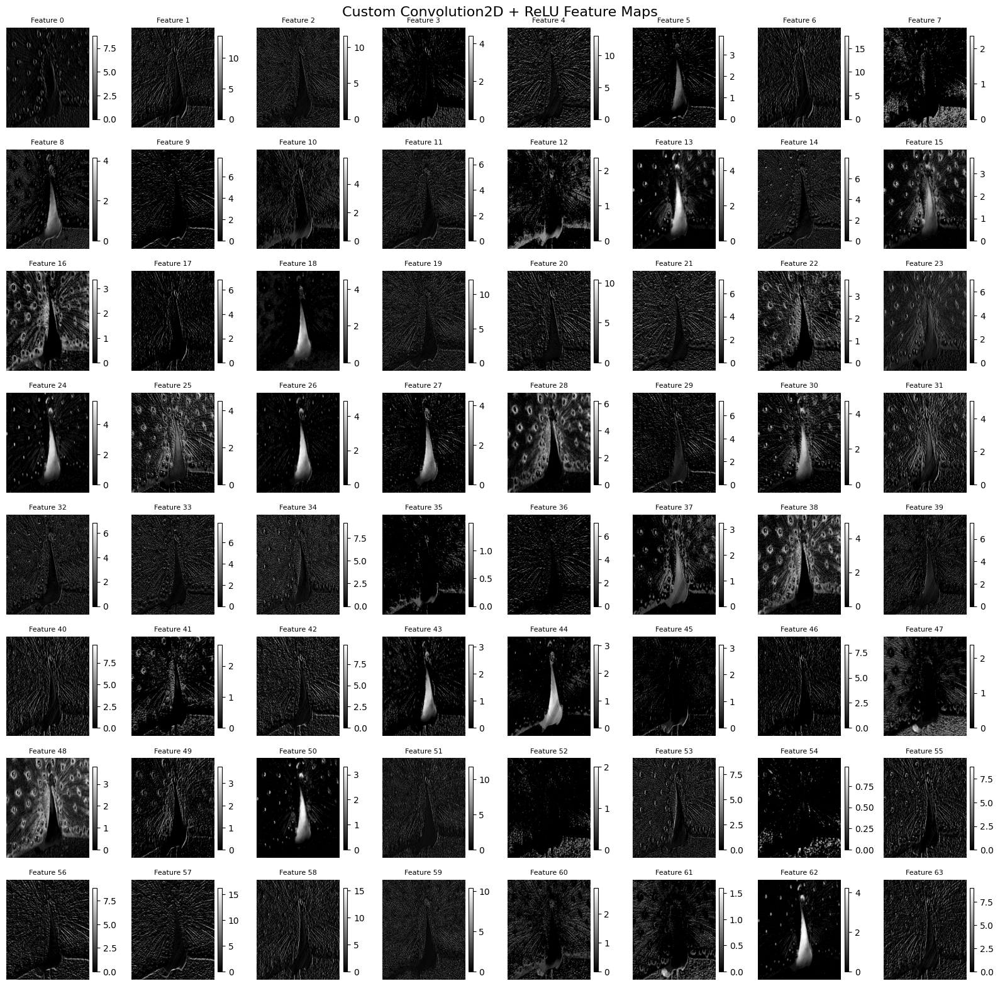

In [20]:
### START CODE HERE ###
# Apply ReLU activation function to the custom convolution result
conv_result_relu = np.maximum(0, conv_result)

# Compare before and after ReLU activation
print(f"Before ReLU - Min: {conv_result.min():.3f}, Max: {conv_result.max():.3f}")
print(f"After ReLU - Min: {conv_result_relu.min():.3f}, Max: {conv_result_relu.max():.3f}")
print(f"Number of negative values clipped: {(conv_result < 0).sum()}")
print(f"Percentage of values clipped: {(conv_result < 0).sum() / conv_result.size * 100:.2f}%")

# Visualize the ReLU activated feature maps
plot_featuremap(conv_result_relu, "Custom Convolution2D + ReLU Feature Maps")
### END CODE HERE ###

---

# Question
1. Show the array of kernel weights used for extracting object color 
and those used for extracting object edge details at least two CNN nodes.
Compare and Discuss how the specific values of these kernel weights influence the CNN's ability 
to detect colors versus edges in images.
2. Why is Matplotlib able to display the output feature map from the convolution layer, even though it contains negative values?
3. Is there a method faster than traditional 2D convolution in the "Convolution 2D from scratch" section?